In [1]:
from pathlib import Path

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

# from kaggle_datasets import KaggleDatasets
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from keras import *

In [2]:
from tensorflow.keras.optimizers import Adam 
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Conv2DTranspose
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.utils.vis_utils import plot_model

In [3]:
!nvidia-smi

Thu Jun 23 07:22:40 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
strategy = tf.distribute.get_strategy()
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [5]:
img_height, img_width = 256, 256
channels = 3

In [6]:
def decode_img(image):
    # convert to 3-channel
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [img_height, img_width])
    # scale to <-1,1>
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    return image

In [7]:
def process_path(file_path):
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img

In [8]:
list_ds = tf.data.Dataset.list_files('../input/imagenetsketch/sketch/*/*.JPEG', shuffle=True)
# batch images so they have the right shape for neural net
styled_ds = list_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(1)

2022-06-23 07:22:41.213779: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-23 07:22:41.310429: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-23 07:22:41.311331: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-23 07:22:41.313717: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In [9]:
def plot(image, ax=None):
    if ax is None:
        ax = plt.gca()
    ax.imshow(image * 0.5 + 0.5)

2022-06-23 07:22:49.999105: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


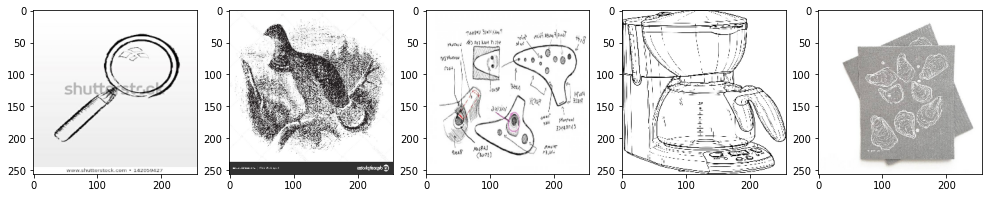

In [10]:
fix, axs = plt.subplots(1, 5, figsize=(17,17))
for batch, ax in zip(styled_ds.take(5), axs):
    plot(batch[0], ax)
plt.show()

In [11]:
list_ds = tf.data.Dataset.list_files('../input/gan-getting-started/photo_jpg/*.jpg', shuffle=True)
photo_ds = list_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(1)

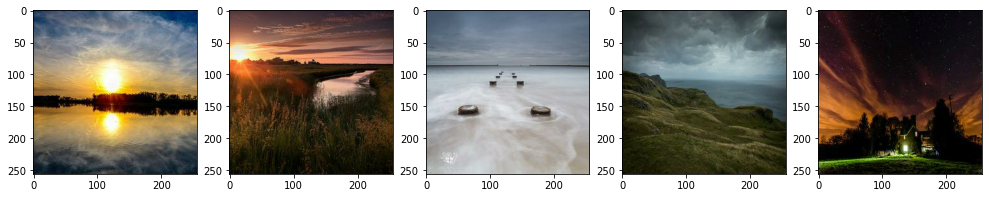

In [12]:
fix, axs = plt.subplots(1, 5, figsize=(17,17))
for batch, ax in zip(photo_ds.take(5), axs):
    plot(batch[0], ax)
plt.show()

In [13]:
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_src_image = Input(shape=image_shape)
    # target image input
#     in_target_image = Input(shape=image_shape)
    # concatenate images channel-wise
    merged = in_src_image
    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(alpha=0.2)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)
    # define model
    model = Model(in_src_image, patch_out)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
    return model

/opt/conda/lib/python3.7/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 128, 128, 64)      3136      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 128)       131200    
_________________________________________________________________
batch_normalization (BatchNo (None, 64, 64, 128)       512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 256)       524544

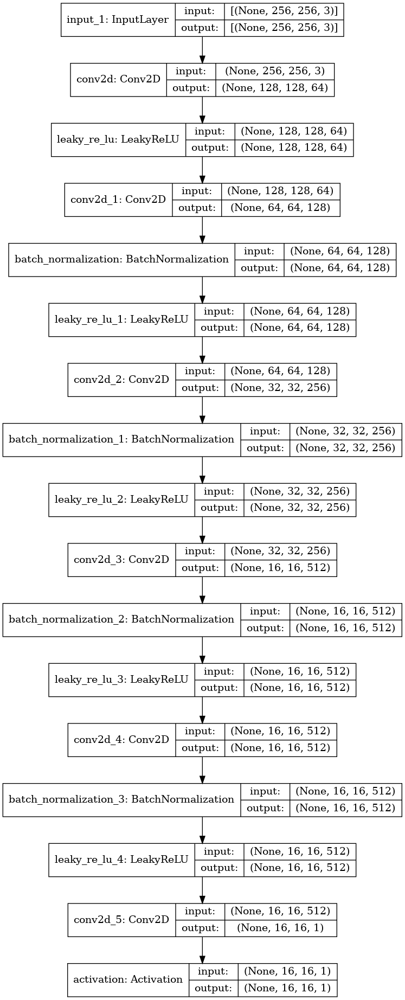

In [14]:
image_shape = (img_height, img_width,3)
d_model = define_discriminator(image_shape)
# summarize the model
d_model.summary()
# plot the model
plot_model(d_model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True)

In [15]:
# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add downsampling layer
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    # conditionally add batch normalization
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    # leaky relu activation
    g = LeakyReLU(alpha=0.2)(g)
    return g

In [16]:
# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add upsampling layer
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    # add batch normalization
    g = BatchNormalization()(g, training=True)
    # conditionally add dropout
    if dropout:
        g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    # relu activation
    g = Activation('relu')(g)
    return g

In [17]:
def define_generator(image_shape=(256,256,3)):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # encoder model: C64-C128-C256-C512-C512-C512-C512-C512
    e1 = define_encoder_block(in_image, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    e7 = define_encoder_block(e6, 512)
    # bottleneck, no batch norm and relu
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    # decoder model: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64, dropout=False)
    # output
    g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model
 

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 128, 128, 64) 3136        input_2[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_5 (LeakyReLU)       (None, 128, 128, 64) 0           conv2d_6[0][0]                   
__________________________________________________________________________________________________
conv2d_7 (Conv2D)               (None, 64, 64, 128)  131200      leaky_re_lu_5[0][0]              
____________________________________________________________________________________________

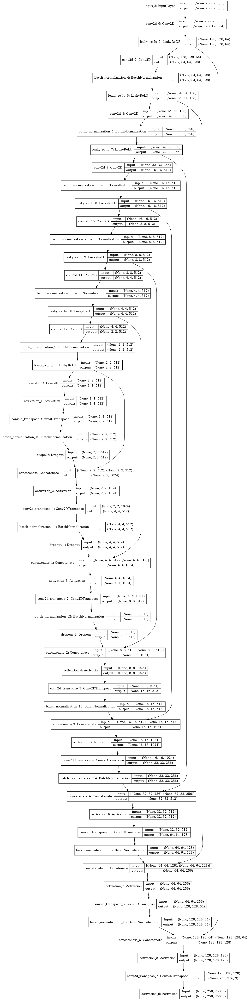

In [18]:
image_shape = (img_height, img_width,3)
# create the model
g_model = define_generator(image_shape)
# summarize the model
g_model.summary()
# plot the model
plot_model(g_model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True)


In [19]:
def define_gan(g_model, d_model, image_shape):
    # make weights in the discriminator not trainable
    for layer in d_model.layers:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = False
    # define the source image
    in_src = Input(shape=image_shape)
    # connect the source image to the generator input
    gen_out = g_model(in_src)
    # connect the source input and generator output to the discriminator input
    dis_out = d_model([in_src, gen_out])
    # src image as input, generated image and classification output
    model = Model(in_src, [dis_out, gen_out])
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
    return model

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
model_1 (Functional)            (None, 256, 256, 3)  54429315    input_3[0][0]                    
__________________________________________________________________________________________________
model (Functional)              (None, 16, 16, 1)    6965185     input_3[0][0]                    
                                                                 model_1[0][0]                    
Total params: 61,394,500
Trainable params: 54,422,275
Non-trainable params: 6,972,225
__________________________________________________________________________________________________


/opt/conda/lib/python3.7/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


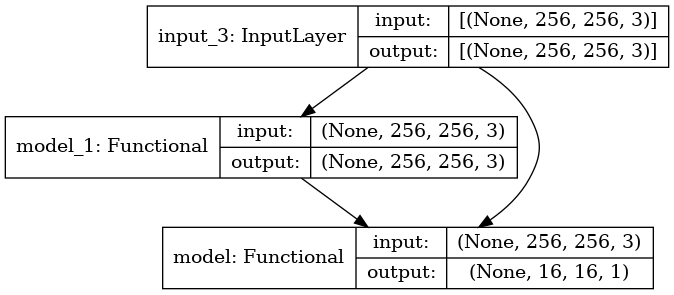

In [20]:
gan_model = define_gan(g_model, d_model, image_shape)
# summarize the model
gan_model.summary()
# plot the model
plot_model(gan_model, to_file='gan_model_plot.png', show_shapes=True, show_layer_names=True)

In [21]:
image_shape = (img_height, img_width,3)
with strategy.scope():
    styled_generator = define_generator(image_shape) # transforms photos to drawings
    photo_generator = define_generator(image_shape) # transforms drawings to photos

    styled_discriminator = define_discriminator(image_shape) # differentiates real and generated drawings
    photo_discriminator = define_discriminator(image_shape) # differentiates real and generated photos


/opt/conda/lib/python3.7/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [22]:
class CycleGan(keras.Model):
    def __init__(
        self,
        styled_generator,
        photo_generator,
        styled_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.s_gen = styled_generator
        self.p_gen = photo_generator
        self.s_disc = styled_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        s_gen_optimizer,
        p_gen_optimizer,
        s_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.s_gen_optimizer = s_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.s_disc_optimizer = s_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        # @TODO: rename
        real_styled, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to styled back to photo
            fake_styled = self.s_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_styled, training=True)

            # styled to photo back to styled
            fake_photo = self.p_gen(real_styled, training=True)
            cycled_styled = self.s_gen(fake_photo, training=True)

            # generating itself
            same_styled = self.s_gen(real_styled, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_styled = self.s_disc(real_styled, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_styled = self.s_disc(fake_styled, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            styled_gen_loss = self.gen_loss_fn(disc_fake_styled)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_styled, cycled_styled, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_styled_gen_loss = styled_gen_loss + total_cycle_loss + self.identity_loss_fn(real_styled, same_styled, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            styled_disc_loss = self.disc_loss_fn(disc_real_styled, disc_fake_styled)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        styled_generator_gradients = tape.gradient(total_styled_gen_loss,
                                                  self.s_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        styled_discriminator_gradients = tape.gradient(styled_disc_loss,
                                                      self.s_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.s_gen_optimizer.apply_gradients(zip(styled_generator_gradients,
                                                 self.s_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.s_disc_optimizer.apply_gradients(zip(styled_discriminator_gradients,
                                                  self.s_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "styled_gen_loss": total_styled_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "styled_disc_loss": styled_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [23]:
with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

In [24]:
with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

In [25]:
with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

In [26]:
with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

In [27]:
with strategy.scope():
    styled_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    styled_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [28]:
with strategy.scope():
    cycle_gan_model = CycleGan(
        styled_generator, photo_generator, styled_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        s_gen_optimizer = styled_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        s_disc_optimizer = styled_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

In [29]:
len(photo_ds), len(styled_ds)

(7038, 50889)

In [30]:
class ShowSamplesCallback(keras.callbacks.Callback):
    def __init__(self, save_to_dir: str):
        self.save_to_dir = save_to_dir
    
    def on_train_begin(self, logs=None):
        self.original = []
        self.styled = []
    
    def on_train_end(self, logs=None):
        if self.save_to_dir:
            dir_ = Path(self.save_to_dir)
            dir_.mkdir(parents=True, exist_ok=True)
            for i, (original, styled) in enumerate(zip(self.original, self.styled)):
                tf.keras.preprocessing.image.save_img(dir_ / f'{i + 1}_original.jpg', original)
                tf.keras.preprocessing.image.save_img(dir_ / f'{i + 1}_styled.jpg', styled)
    
    def on_epoch_end(self, epoch, logs=None):
        styled_generator = self.model.s_gen
        # sample predict
        img_batch = next(iter(photo_ds.take(1)))
        prediction = styled_generator(img_batch, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        img = img_batch[0]
        img = (img * 127.5 + 127.5).numpy().astype(np.uint8)
        self.original.append(img)
        self.styled.append(prediction)
        
        # plot
        fig, axs = plt.subplots(1, 2, figsize=(6,6), squeeze=True)
        axs[0].imshow(img)
        axs[1].imshow(prediction)
        axs[0].set_title("Input Photo [{:02d}]".format(epoch + 1))
        axs[1].set_title("Generated [{:02d}]".format(epoch + 1))
        axs[0].axis("off")
        axs[1].axis("off")
        plt.show()

In [31]:
class SaveGeneratorCallback(keras.callbacks.Callback):
    def __init__(self, epochs: int, path: str):
        self.epochs = epochs
        self.dir_ = Path(path)
    
    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.epochs == 0:
            styled_generator = self.model.s_gen
            path = self.dir_ / f'weights.{epoch + 1}.hdf5'
            print(f'[SaveGeneratorCallback] Saving weights to {path}.')
            styled_generator.save_weights(path)

In [32]:
HOUR_TO_SECONDS = 3600

In [33]:
epoch = 120

Epoch 1/120


/opt/conda/lib/python3.7/site-packages/keras/backend.py:4994: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  '"`binary_crossentropy` received `from_logits=True`, but the `output`'
2022-06-23 07:23:25.394396: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 1624 of 3000
2022-06-23 07:23:33.582622: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.
2022-06-23 07:23:44.555730: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 2437 of 3000
2022-06-23 07:23:46.566848: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.
2022-06-23 07:23:47.347820: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


1000/1000 [==============================] - 293s 242ms/step - styled_gen_loss: 7.9214 - photo_gen_loss: 7.3828 - styled_disc_loss: 0.4566 - photo_disc_loss: 0.6178


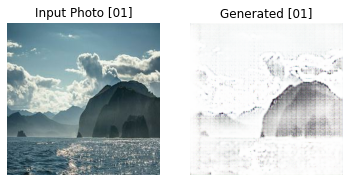

[SaveGeneratorCallback] Saving weights to /kaggle/working/weights.1.hdf5.
Epoch 2/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 6.7768 - photo_gen_loss: 6.0959 - styled_disc_loss: 0.4259 - photo_disc_loss: 0.5983


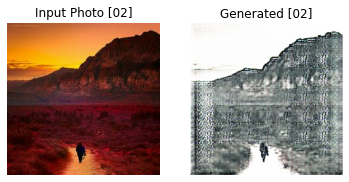

Epoch 3/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 6.1578 - photo_gen_loss: 5.4982 - styled_disc_loss: 0.4354 - photo_disc_loss: 0.5936


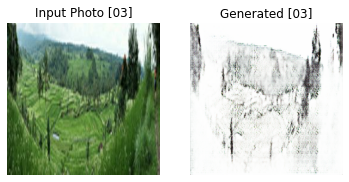

Epoch 4/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 6.0958 - photo_gen_loss: 5.4226 - styled_disc_loss: 0.4214 - photo_disc_loss: 0.5865


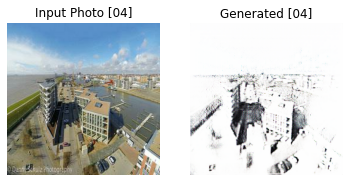

Epoch 5/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.9671 - photo_gen_loss: 5.2365 - styled_disc_loss: 0.4312 - photo_disc_loss: 0.5890


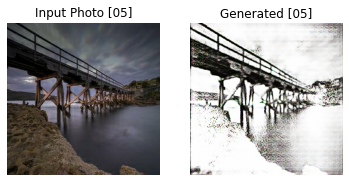

Epoch 6/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.8734 - photo_gen_loss: 5.2037 - styled_disc_loss: 0.4108 - photo_disc_loss: 0.5844


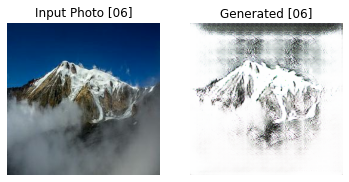

Epoch 7/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.9250 - photo_gen_loss: 5.1017 - styled_disc_loss: 0.3865 - photo_disc_loss: 0.5719


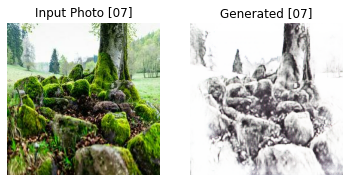

Epoch 8/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.9065 - photo_gen_loss: 5.0810 - styled_disc_loss: 0.3858 - photo_disc_loss: 0.5706


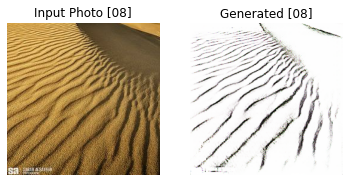

Epoch 9/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.8872 - photo_gen_loss: 5.0340 - styled_disc_loss: 0.3808 - photo_disc_loss: 0.5647


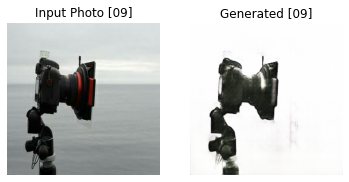

Epoch 10/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.8630 - photo_gen_loss: 4.9904 - styled_disc_loss: 0.3834 - photo_disc_loss: 0.5667


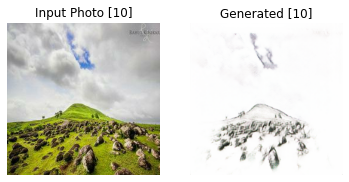

Epoch 11/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.7044 - photo_gen_loss: 4.9610 - styled_disc_loss: 0.3937 - photo_disc_loss: 0.5512


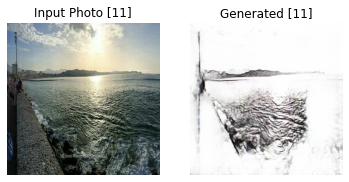

Epoch 12/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.7127 - photo_gen_loss: 4.9756 - styled_disc_loss: 0.3858 - photo_disc_loss: 0.5361


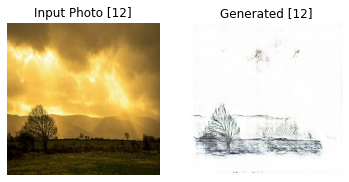

Epoch 13/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.5941 - photo_gen_loss: 4.9501 - styled_disc_loss: 0.3842 - photo_disc_loss: 0.5320


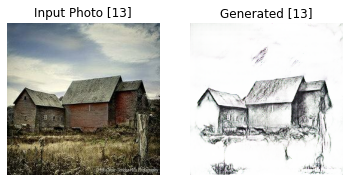

Epoch 14/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.5738 - photo_gen_loss: 4.8638 - styled_disc_loss: 0.3792 - photo_disc_loss: 0.5465


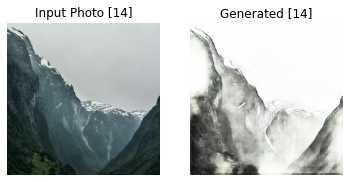

Epoch 15/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.6795 - photo_gen_loss: 4.9595 - styled_disc_loss: 0.3746 - photo_disc_loss: 0.5232


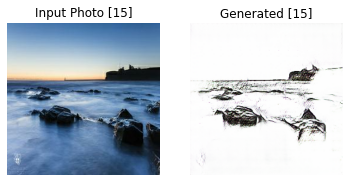

Epoch 16/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.4960 - photo_gen_loss: 4.8692 - styled_disc_loss: 0.3836 - photo_disc_loss: 0.5145


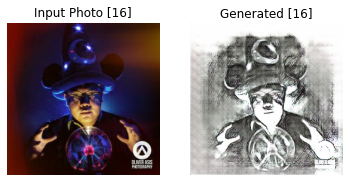

Epoch 17/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.5295 - photo_gen_loss: 4.9807 - styled_disc_loss: 0.3870 - photo_disc_loss: 0.5162


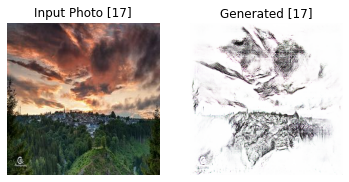

Epoch 18/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.5558 - photo_gen_loss: 4.8707 - styled_disc_loss: 0.3756 - photo_disc_loss: 0.5231


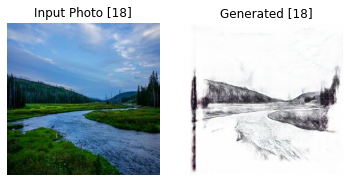

Epoch 19/120
1000/1000 [==============================] - 242s 243ms/step - styled_gen_loss: 5.5114 - photo_gen_loss: 4.8363 - styled_disc_loss: 0.3916 - photo_disc_loss: 0.5208


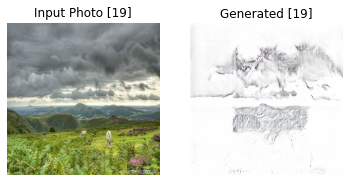

Epoch 20/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.4733 - photo_gen_loss: 4.8550 - styled_disc_loss: 0.3855 - photo_disc_loss: 0.5166


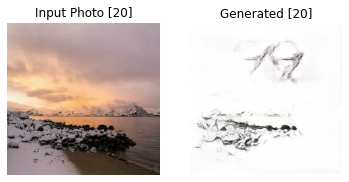

Epoch 21/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.3328 - photo_gen_loss: 4.8489 - styled_disc_loss: 0.3957 - photo_disc_loss: 0.5002


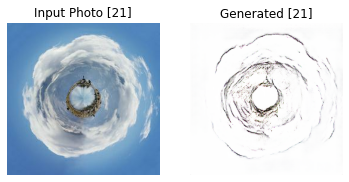

Epoch 22/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.3861 - photo_gen_loss: 4.8670 - styled_disc_loss: 0.3846 - photo_disc_loss: 0.4928


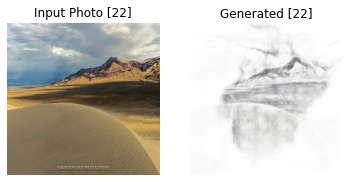

Epoch 23/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2342 - photo_gen_loss: 4.7782 - styled_disc_loss: 0.3953 - photo_disc_loss: 0.5014


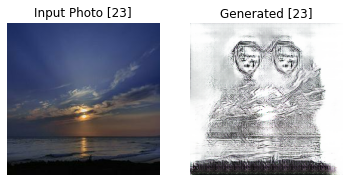

Epoch 24/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.3093 - photo_gen_loss: 4.8607 - styled_disc_loss: 0.3900 - photo_disc_loss: 0.4917


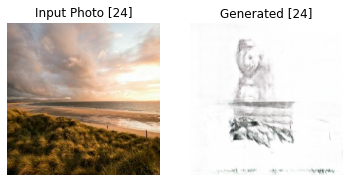

Epoch 25/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.3331 - photo_gen_loss: 4.8412 - styled_disc_loss: 0.3721 - photo_disc_loss: 0.4844


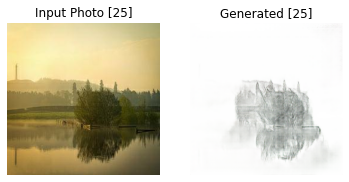

Epoch 26/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.4798 - photo_gen_loss: 4.9348 - styled_disc_loss: 0.3713 - photo_disc_loss: 0.4728


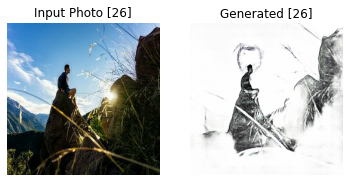

Epoch 27/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2848 - photo_gen_loss: 4.7948 - styled_disc_loss: 0.3815 - photo_disc_loss: 0.4828


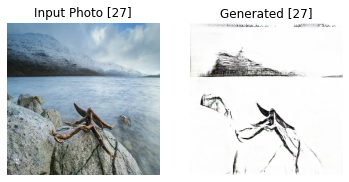

Epoch 28/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2118 - photo_gen_loss: 4.7469 - styled_disc_loss: 0.3829 - photo_disc_loss: 0.4810


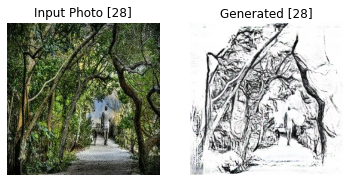

Epoch 29/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.1232 - photo_gen_loss: 4.7289 - styled_disc_loss: 0.3858 - photo_disc_loss: 0.4763


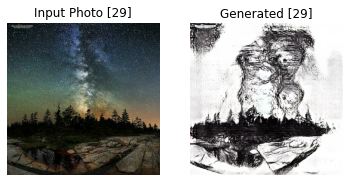

Epoch 30/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.3026 - photo_gen_loss: 4.8652 - styled_disc_loss: 0.3611 - photo_disc_loss: 0.4660


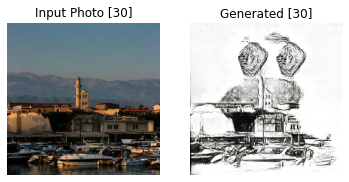

Epoch 31/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.0398 - photo_gen_loss: 4.7129 - styled_disc_loss: 0.3867 - photo_disc_loss: 0.4656


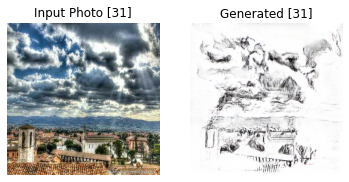

Epoch 32/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.1858 - photo_gen_loss: 4.8455 - styled_disc_loss: 0.3852 - photo_disc_loss: 0.4668


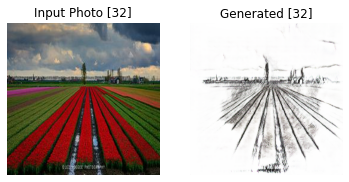

Epoch 33/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2472 - photo_gen_loss: 4.8394 - styled_disc_loss: 0.3801 - photo_disc_loss: 0.4687


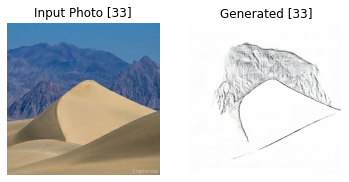

Epoch 34/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.2120 - photo_gen_loss: 4.8609 - styled_disc_loss: 0.3818 - photo_disc_loss: 0.4656


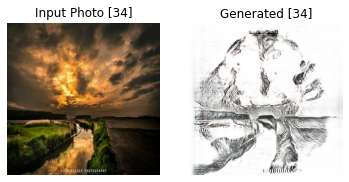

Epoch 35/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.1376 - photo_gen_loss: 4.7548 - styled_disc_loss: 0.3695 - photo_disc_loss: 0.4601


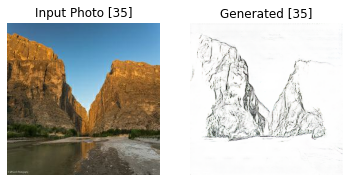

Epoch 36/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.0825 - photo_gen_loss: 4.7457 - styled_disc_loss: 0.3765 - photo_disc_loss: 0.4594


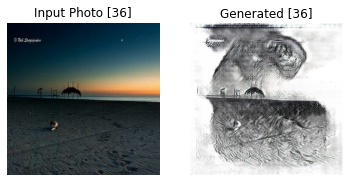

Epoch 37/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.1659 - photo_gen_loss: 4.9427 - styled_disc_loss: 0.3648 - photo_disc_loss: 0.4325


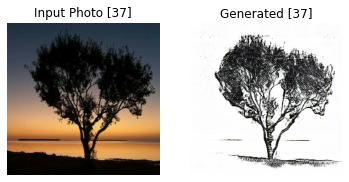

Epoch 38/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.1783 - photo_gen_loss: 4.8496 - styled_disc_loss: 0.3655 - photo_disc_loss: 0.4486


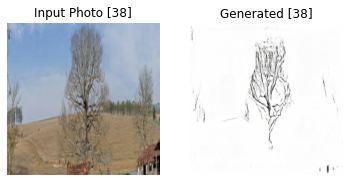

Epoch 39/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.1727 - photo_gen_loss: 4.7830 - styled_disc_loss: 0.3465 - photo_disc_loss: 0.4321


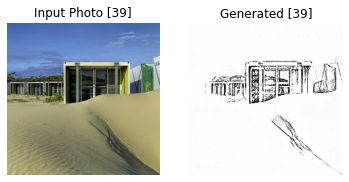

Epoch 40/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.2330 - photo_gen_loss: 4.8927 - styled_disc_loss: 0.3461 - photo_disc_loss: 0.4352


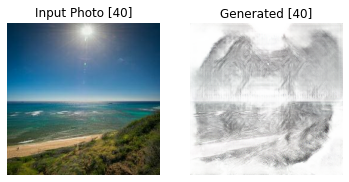

Epoch 41/120
1000/1000 [==============================] - 239s 239ms/step - styled_gen_loss: 5.0217 - photo_gen_loss: 4.7284 - styled_disc_loss: 0.3833 - photo_disc_loss: 0.4467


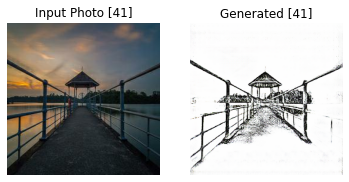

Epoch 42/120
1000/1000 [==============================] - 239s 239ms/step - styled_gen_loss: 5.0541 - photo_gen_loss: 4.7346 - styled_disc_loss: 0.3780 - photo_disc_loss: 0.4588


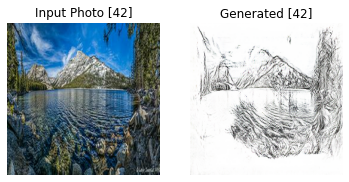

Epoch 43/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.0626 - photo_gen_loss: 4.8782 - styled_disc_loss: 0.3697 - photo_disc_loss: 0.4126


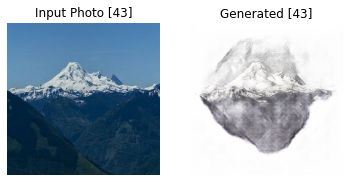

Epoch 44/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.1854 - photo_gen_loss: 4.9057 - styled_disc_loss: 0.3648 - photo_disc_loss: 0.4173


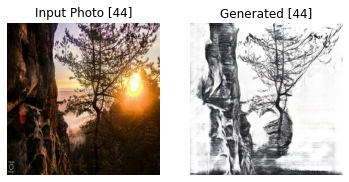

Epoch 45/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.3024 - photo_gen_loss: 5.0148 - styled_disc_loss: 0.3377 - photo_disc_loss: 0.4100


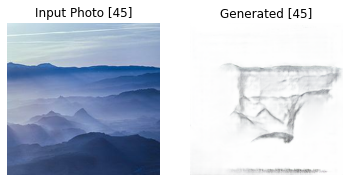

Epoch 46/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.0492 - photo_gen_loss: 4.9909 - styled_disc_loss: 0.3697 - photo_disc_loss: 0.4036


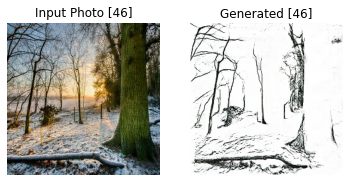

Epoch 47/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.0748 - photo_gen_loss: 4.9470 - styled_disc_loss: 0.3516 - photo_disc_loss: 0.4115


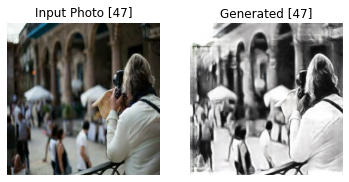

Epoch 48/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.1745 - photo_gen_loss: 5.0157 - styled_disc_loss: 0.3355 - photo_disc_loss: 0.3982


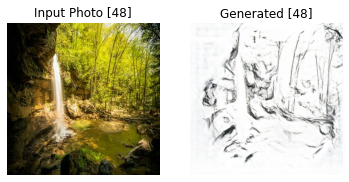

Epoch 49/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.1177 - photo_gen_loss: 5.0622 - styled_disc_loss: 0.3667 - photo_disc_loss: 0.4034


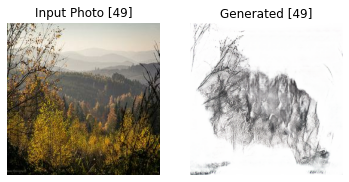

Epoch 50/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.1778 - photo_gen_loss: 5.0486 - styled_disc_loss: 0.3464 - photo_disc_loss: 0.3846


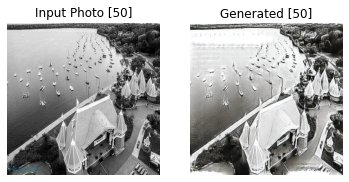

Epoch 51/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.1125 - photo_gen_loss: 5.2963 - styled_disc_loss: 0.3456 - photo_disc_loss: 0.3516


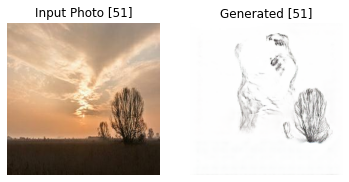

[SaveGeneratorCallback] Saving weights to /kaggle/working/weights.51.hdf5.
Epoch 52/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2470 - photo_gen_loss: 5.3061 - styled_disc_loss: 0.3436 - photo_disc_loss: 0.3606


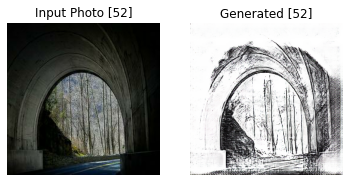

Epoch 53/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.1080 - photo_gen_loss: 5.4095 - styled_disc_loss: 0.3557 - photo_disc_loss: 0.3229


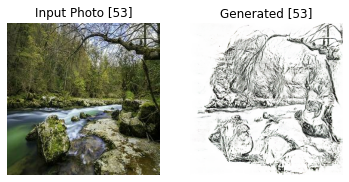

Epoch 54/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.0850 - photo_gen_loss: 5.4138 - styled_disc_loss: 0.3597 - photo_disc_loss: 0.3453


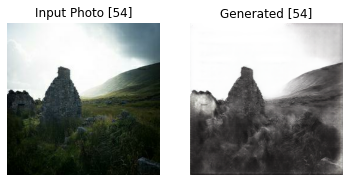

Epoch 55/120
1000/1000 [==============================] - 251s 251ms/step - styled_gen_loss: 5.2303 - photo_gen_loss: 5.5204 - styled_disc_loss: 0.3195 - photo_disc_loss: 0.3197


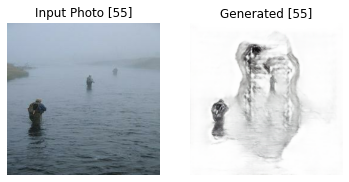

Epoch 56/120
1000/1000 [==============================] - 239s 239ms/step - styled_gen_loss: 5.2161 - photo_gen_loss: 5.7084 - styled_disc_loss: 0.3487 - photo_disc_loss: 0.2925


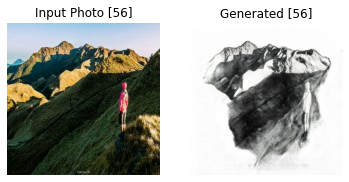

Epoch 57/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.0741 - photo_gen_loss: 5.7441 - styled_disc_loss: 0.3486 - photo_disc_loss: 0.2854


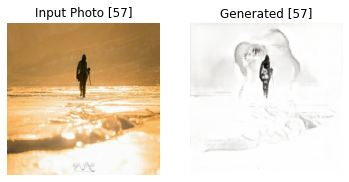

Epoch 58/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.2776 - photo_gen_loss: 5.9431 - styled_disc_loss: 0.3384 - photo_disc_loss: 0.2753


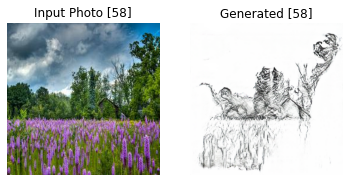

Epoch 59/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.0832 - photo_gen_loss: 5.8035 - styled_disc_loss: 0.3620 - photo_disc_loss: 0.2886


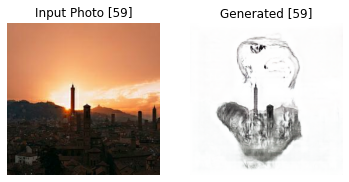

Epoch 60/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.1753 - photo_gen_loss: 5.8396 - styled_disc_loss: 0.3316 - photo_disc_loss: 0.2719


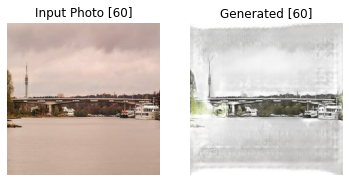

Epoch 61/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.1980 - photo_gen_loss: 5.9898 - styled_disc_loss: 0.3468 - photo_disc_loss: 0.2863


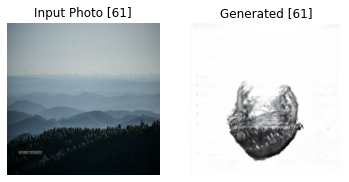

Epoch 62/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.1790 - photo_gen_loss: 6.1096 - styled_disc_loss: 0.3410 - photo_disc_loss: 0.2470


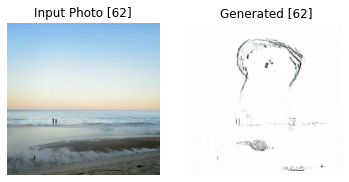

Epoch 63/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2735 - photo_gen_loss: 6.2270 - styled_disc_loss: 0.3331 - photo_disc_loss: 0.2401


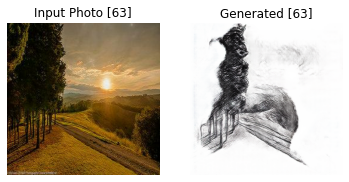

Epoch 64/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.3222 - photo_gen_loss: 6.4278 - styled_disc_loss: 0.3230 - photo_disc_loss: 0.2400


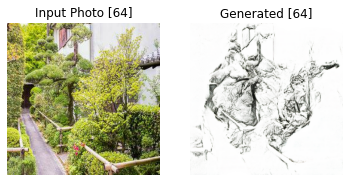

Epoch 65/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2837 - photo_gen_loss: 6.1239 - styled_disc_loss: 0.3351 - photo_disc_loss: 0.2558


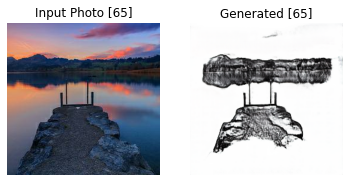

Epoch 66/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.2927 - photo_gen_loss: 6.3689 - styled_disc_loss: 0.3151 - photo_disc_loss: 0.2392


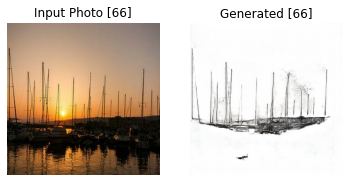

Epoch 67/120
1000/1000 [==============================] - 243s 243ms/step - styled_gen_loss: 5.3859 - photo_gen_loss: 6.4244 - styled_disc_loss: 0.3178 - photo_disc_loss: 0.2322


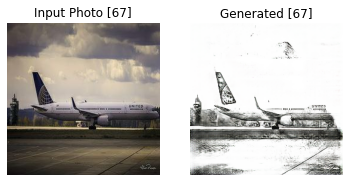

Epoch 68/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.4601 - photo_gen_loss: 6.4913 - styled_disc_loss: 0.3254 - photo_disc_loss: 0.2218


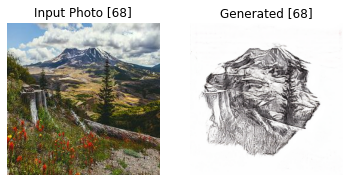

Epoch 69/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.3794 - photo_gen_loss: 6.6280 - styled_disc_loss: 0.3195 - photo_disc_loss: 0.2201


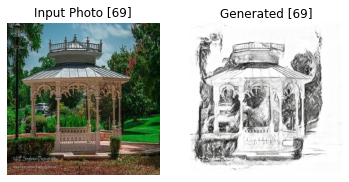

Epoch 70/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.4312 - photo_gen_loss: 6.6038 - styled_disc_loss: 0.2952 - photo_disc_loss: 0.2258


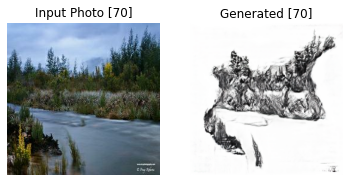

Epoch 71/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.4920 - photo_gen_loss: 6.8179 - styled_disc_loss: 0.3134 - photo_disc_loss: 0.1937


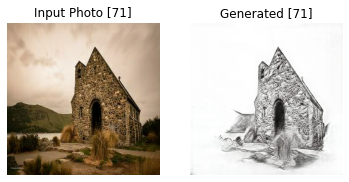

Epoch 72/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.5658 - photo_gen_loss: 6.7413 - styled_disc_loss: 0.2899 - photo_disc_loss: 0.2145


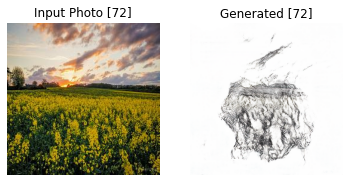

Epoch 73/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.5642 - photo_gen_loss: 6.7681 - styled_disc_loss: 0.3093 - photo_disc_loss: 0.2185


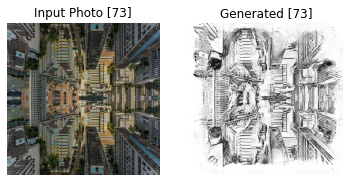

Epoch 74/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.4992 - photo_gen_loss: 6.7768 - styled_disc_loss: 0.2975 - photo_disc_loss: 0.2082


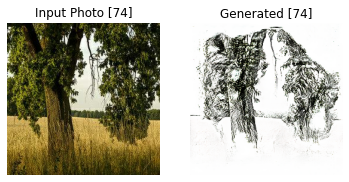

Epoch 75/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 6.0018 - photo_gen_loss: 6.9359 - styled_disc_loss: 0.2599 - photo_disc_loss: 0.2269


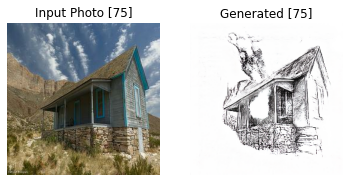

Epoch 76/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.7269 - photo_gen_loss: 6.7105 - styled_disc_loss: 0.2870 - photo_disc_loss: 0.2161


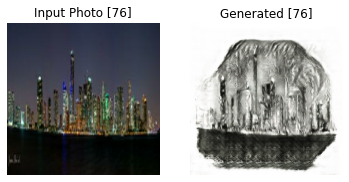

Epoch 77/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.9833 - photo_gen_loss: 7.2037 - styled_disc_loss: 0.2769 - photo_disc_loss: 0.2005


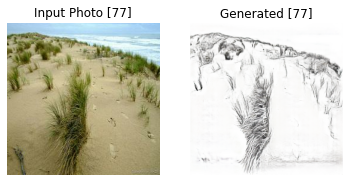

Epoch 78/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.9459 - photo_gen_loss: 6.8975 - styled_disc_loss: 0.2742 - photo_disc_loss: 0.1983


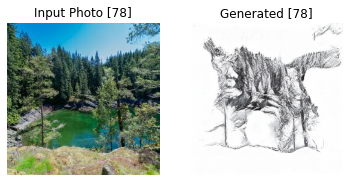

Epoch 79/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.6543 - photo_gen_loss: 7.1557 - styled_disc_loss: 0.3014 - photo_disc_loss: 0.2026


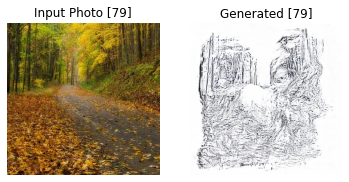

Epoch 80/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.8356 - photo_gen_loss: 7.0283 - styled_disc_loss: 0.2865 - photo_disc_loss: 0.2066


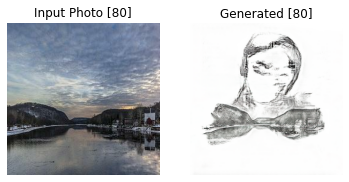

Epoch 81/120
1000/1000 [==============================] - 240s 240ms/step - styled_gen_loss: 5.6249 - photo_gen_loss: 6.9511 - styled_disc_loss: 0.3025 - photo_disc_loss: 0.2138


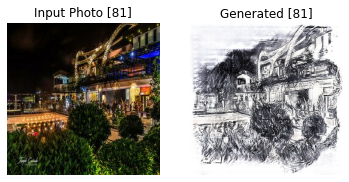

Epoch 82/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 6.0251 - photo_gen_loss: 7.1421 - styled_disc_loss: 0.2598 - photo_disc_loss: 0.1755


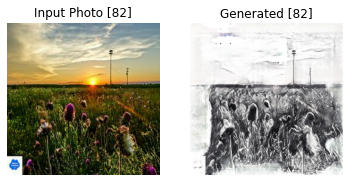

Epoch 83/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.9257 - photo_gen_loss: 7.0218 - styled_disc_loss: 0.2773 - photo_disc_loss: 0.2140


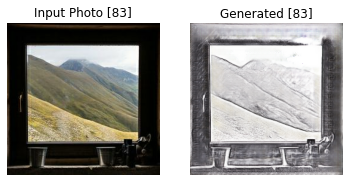

Epoch 84/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.7594 - photo_gen_loss: 6.9958 - styled_disc_loss: 0.2854 - photo_disc_loss: 0.2035


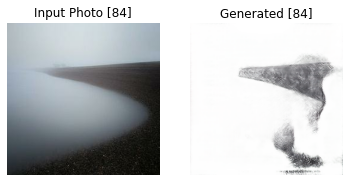

Epoch 85/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.7480 - photo_gen_loss: 6.9140 - styled_disc_loss: 0.2760 - photo_disc_loss: 0.1961


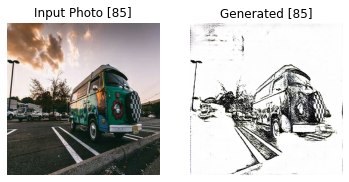

Epoch 86/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 6.3259 - photo_gen_loss: 7.3151 - styled_disc_loss: 0.2213 - photo_disc_loss: 0.1831


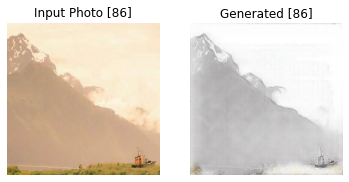

Epoch 87/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.7317 - photo_gen_loss: 7.1395 - styled_disc_loss: 0.2920 - photo_disc_loss: 0.1779


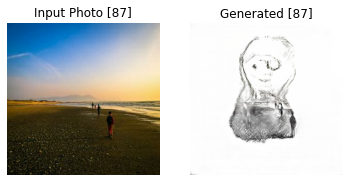

Epoch 88/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 5.9051 - photo_gen_loss: 7.2273 - styled_disc_loss: 0.2660 - photo_disc_loss: 0.1812


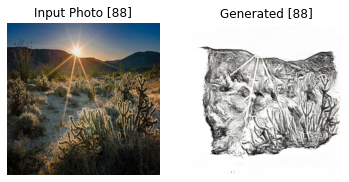

Epoch 89/120
1000/1000 [==============================] - 242s 242ms/step - styled_gen_loss: 5.8695 - photo_gen_loss: 7.3913 - styled_disc_loss: 0.2761 - photo_disc_loss: 0.1824


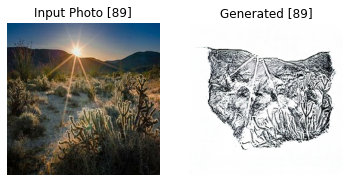

Epoch 90/120
1000/1000 [==============================] - 241s 241ms/step - styled_gen_loss: 6.2082 - photo_gen_loss: 7.2592 - styled_disc_loss: 0.2289 - photo_disc_loss: 0.1938


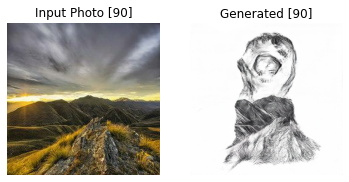

Timed stopping at epoch 90 after training for 6:00:00


In [34]:
_buffer_size = 3000

history = cycle_gan_model.fit(
    # zipped dataset - infinitely repeating
    tf.data.Dataset.zip((
        # buffer_size should be at least the size of the dataset for uniform shuffling
        # - https://stackoverflow.com/a/47025850/3936732
        # - however the dataset is too large for that so we limit the size
        styled_ds.shuffle(_buffer_size, reshuffle_each_iteration=True).repeat(),
        photo_ds.shuffle(_buffer_size, reshuffle_each_iteration=True).repeat(),
    )),
    
    steps_per_epoch=1000, # batches per epoch
    epochs=epoch,
    # --- callbacks ---
    callbacks=[
        tfa.callbacks.TimeStopping(seconds=HOUR_TO_SECONDS * 6, verbose=1),
        ShowSamplesCallback('/kaggle/working/imgs'),
        SaveGeneratorCallback(50, '/kaggle/working'),
              ],
)